In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from copy import deepcopy
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, datasets

In [ ]:
# 환경설정
if torch.cuda.is_available():
  DEVICE = torch.device('cuda')
else:
  DEVICE = torch.device('cpu')
print(DEVICE)

cuda


In [ ]:
# 학습 조건 설정
BATCH_SIZE = 64
EPOCHS = 10

In [ ]:
# 패키기 불러오기
import sys
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy

import torch
import torch.nn as nn
import torch.nn.functional as F
import warnings
from tqdm import tqdm_notebook

warnings.filterwarnings(action='ignore')

In [ ]:
# 구글 코랩을 통해서 GPU를 이용한 학습을 함

if torch.cuda.is_available():
  DEVICE = torch.device('cuda')
else:
  DEVICE = torch.device('cpu')

print(DEVICE)

cuda


In [ ]:
# 재현가능성을 위한 seed 고정
def seed_everything(seed = 22):
  random.seed(seed)
  np.random.seed(seed)
  os.environ["PYTHONHASHSEED"] = str(seed)

  # torch 용
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)
  torch.cuda.manual_seed_all(seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = True

seed_everything()

In [ ]:
BATCH_SIZE = 128
EPOCHS = 100

# 데이터 가져오기

## 이미지

In [ ]:
import pickle

DATA_DIR = '/content/drive/MyDrive/투빅스 컨퍼런스/Data/'

image_dict = {}

# load
for i in range(5):
  with open(DATA_DIR + f'image_data_dict_v2_{i + 1}.pickle', 'rb') as f:
      image = pickle.load(f)
      
  image_dict.update(image)

len(image_dict)

22458

## 게임 메타 정보

In [ ]:
content_df = pd.read_csv(DATA_DIR + 'steam_game_meta_data_final.csv')
content_df.head()

,game_id,title,content,Image_url,genres,clean_genres,appid,name,developer,publisher,score_rank,positive,negative,userscore,owners,average_forever,average_2weeks,median_forever,median_2weeks,price,initialprice,discount,languages,genre,ccu,tags,label_encode_game_id,game_total_cnt,game_rec_cnt,game_not_rec_cnt,recommend_ratio,not_recommend_ratio,game_total_avg_play_time,game_rec_avg_play_time,game_not_rec_avg_play_time
0,10,Counter-Strike,Play the world's number 1 online action game. ...,https://cdn.akamai.steamstatic.com/steam/apps/...,\n\r\n\t\t\t\t\t\t\t\t\t\t\t\tAction\t\t\t\t\t...,"['Action', 'FPS', 'Multiplayer', 'Shooter', 'C...",10,Counter-Strike,Valve,Valve,NaN,178066,4597,0,"10,000,000 .. 20,000,000",12516,431,185,764,199.0,999.0,80.0,"English, French, German, Italian, Spanish - Sp...",Action,13111,"{'Action': 5355, 'FPS': 4771, 'Multiplayer': 3...",0,504,475.0,29.0,0.942460,0.057540,42992.559524,45121.048421,8129.379310
1,20,Team Fortress Classic,One of the most popular online action games of...,https://cdn.akamai.steamstatic.com/steam/apps/...,\n\r\n\t\t\t\t\t\t\t\t\t\t\t\tAction\t\t\t\t\t...,"['Action', 'FPS', 'Multiplayer', 'Classic', 'H...",20,Team Fortress Classic,Valve,Valve,NaN,4949,838,0,"2,000,000 .. 5,000,000",2353,0,17,0,99.0,499.0,80.0,"English, French, German, Italian, Spanish - Sp...",Action,89,"{'Action': 741, 'FPS': 302, 'Multiplayer': 255...",1,164,130.0,34.0,0.792683,0.207317,11446.682927,14363.538462,294.000000
2,30,Day of Defeat,Enlist in an intense brand of Axis vs. Allied ...,https://cdn.akamai.steamstatic.com/steam/apps/...,\n\r\n\t\t\t\t\t\t\t\t\t\t\t\tFPS\t\t\t\t\t\t\...,"['FPS', 'World War II', 'Multiplayer', 'Shoote...",30,Day of Defeat,Valve,Valve,NaN,4723,521,0,"5,000,000 .. 10,000,000",2164,0,39,0,99.0,499.0,80.0,"English, French, German, Italian, Spanish - Spain",Action,122,"{'FPS': 780, 'World War II': 245, 'Multiplayer...",2,107,87.0,20.0,0.813084,0.186916,23939.551402,28533.034483,3957.900000
3,40,Deathmatch Classic,Enjoy fast-paced multiplayer gaming with Death...,https://cdn.akamai.steamstatic.com/steam/apps/...,\n\r\n\t\t\t\t\t\t\t\t\t\t\t\tAction\t\t\t\t\t...,"['Action', 'FPS', 'Classic', 'Multiplayer', 'S...",40,Deathmatch Classic,Valve,Valve,NaN,1733,377,0,"5,000,000 .. 10,000,000",2862,0,11,0,99.0,499.0,80.0,"English, French, German, Italian, Spanish - Sp...",Action,5,"{'Action': 627, 'FPS': 137, 'Classic': 105, 'M...",3,97,78.0,19.0,0.804124,0.195876,14408.845361,16979.000000,3857.684211
4,50,Half-Life: Opposing Force,Return to the Black Mesa Research Facility as ...,https://cdn.akamai.steamstatic.com/steam/apps/...,\n\r\n\t\t\t\t\t\t\t\t\t\t\t\tFPS\t\t\t\t\t\t\...,"['FPS', 'Action', 'Classic', 'Sci-fi', 'Single...",50,Half-Life: Opposing Force,Gearbox Software,Valve,NaN,11285,581,0,"5,000,000 .. 10,000,000",1494,0,208,0,99.0,499.0,80.0,"English, French, German, Korean",Action,137,"{'FPS': 874, 'Action': 316, 'Sci-fi': 242, 'Cl...",4,293,276.0,17.0,0.941980,0.058020,4025.447099,3990.065217,4599.882353


# 데이터 셋 만들기

In [ ]:
from PIL import Image

labels = []
images = []

def get_labels_images(x):
  game_id = x['game_id']
  image = image_dict[game_id]
  image = Image.fromarray(image)
  image = image.resize((28, 28)).convert('RGB')
  image = np.array(image)
  image = image.reshape(1, 28, 28, 3)
  image = np.swapaxes(image, 1, 3)

  labels.append(game_id)
  images.append(image)

_ =  content_df.apply(lambda x : get_labels_images(x), axis = 1)
labels = np.array(labels)
images = np.concatenate(images)

In [ ]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

class CustomDataset(Dataset):

  # 데이터 정의
  def __init__(self, x_data, y_data = None):
    self.x_data = x_data
    self.y_data = y_data.reshape(-1,1)

  # 이 데이터 셋의 총 데이터 수
  def __len__(self):
    return len(self.x_data)

  # 어떠한 idx를 받았을 때 그에 맞는 데이터를 반환
  def __getitem__(self, idx):
    if self.y_data is None:
      x = torch.FloatTensor(self.x_data[idx])
      return x
    else:
      x = torch.FloatTensor(self.x_data[idx])
      y = torch.LongTensor(self.y_data[idx])[0]
      return x, y

In [ ]:
dataset = CustomDataset(x_data = images, y_data = labels)

dataloader = DataLoader(
    dataset,
    batch_size = BATCH_SIZE,
    shuffle = False
)

for (X_train, y_train) in dataloader:
  print(X_train.size())
  print(y_train.size())
  break

torch.Size([128, 3, 28, 28])
torch.Size([128])


In [ ]:
image = image_dict[10]
image = Image.fromarray(image)
image = image.resize((28, 28)).convert('RGB')
image = np.array(image)
image = image.reshape(28, 28, 3)
image = np.swapaxes(image, 0, 2)
image = np.swapaxes(image, 2, 0)
Image.fromarray(image)

# CNN을 Base로 만든 AutoEncoder

In [ ]:
# AutoEncoder 모델 설계
class AE(nn.Module):
  def __init__(self):
    super(AE, self).__init__()

    self.encoder = nn.Sequential(
        nn.Conv2d(3,16,3,padding=1),   # batch x 16 x 28 x 28
        nn.ReLU(),
        nn.BatchNorm2d(16),
        nn.Conv2d(16,32,3,padding=1),  # batch x 32 x 28 x 28
        nn.ReLU(),
        nn.BatchNorm2d(32),
        nn.Conv2d(32,64,3,padding=1),  # batch x 32 x 28 x 28
        nn.ReLU(),
        nn.BatchNorm2d(64),
        nn.MaxPool2d(2,2),   # batch x 64 x 14 x 14
        nn.Conv2d(64,128,3,padding=1),  # batch x 128 x 14 x 14
        nn.ReLU(),
        nn.BatchNorm2d(128),
        nn.MaxPool2d(2,2),
        nn.Conv2d(128,256,3,padding=1),  # batch x 256 x 7 x 7
        nn.ReLU()
    )

    self.encoder_fc = nn.Sequential(
        nn.Linear(256 * 7 * 7, 128)
    )

    self.decoder_fc = nn.Sequential(
        nn.Linear(128, 256 * 7 * 7)
    )

    self.decoder = nn.Sequential(
        nn.ConvTranspose2d(256, 128, 3, 2, 1, 1), # batch x 128 x 14 x 14
        nn.ReLU(),
        nn.BatchNorm2d(128),
        nn.ConvTranspose2d(128, 64, 3, 1, 1), # batch x 64 x 14 x 14
        nn.ReLU(),
        nn.BatchNorm2d(64),
        nn.ConvTranspose2d(64, 16, 3, 1, 1), # batch x 16 x 14 x 14
        nn.ReLU(),
        nn.BatchNorm2d(16),
        nn.ConvTranspose2d(16, 3, 3, 2, 1, 1), # batch x 1 x 28 x 28
        nn.ReLU()
    )

  def forward(self, x):
    encoded = self.encoder(x)
    encoded = self.encoder_fc(encoded.view(-1, 256 * 7 * 7))

    decoded = self.decoder_fc(encoded)
    decoded = self.decoder(decoded.view(-1, 256, 7, 7))
    return encoded, decoded.view(-1, 3 * 28 * 28)

In [ ]:
# 모델 정의
model = AE().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

print(model)

AE(
  (encoder): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


In [ ]:
# 학습 정의
def train(model, train_loader, optimizer):
  model.train() # 모델을 학습상태로 지정
  train_loss = 0
  for batch_idx, (image, _) in enumerate(train_loader):
    image = image.to(DEVICE)
    target = image.view(-1, 3 * 28 * 28).to(DEVICE)
    optimizer.zero_grad()
    encoded, decoded = model(image)
    loss = criterion(decoded, target)
    loss.backward()
    optimizer.step()

    train_loss += loss.item()

  train_loss /= len(train_loader)
  return train_loss

In [ ]:
# 평가 정의
def evaluate(model, test_loader):
  model.eval() # 모델을 평가상태로 지정
  test_loss = 0
  real_image = []
  gen_image = []

  with torch.no_grad(): # 모델을 평가하는 단계에서 기울기를 통해 파라미터 값이 업데이트 되는 현상을 방지하기 위해서 지정, Gradient의 흐름을 억제
    for image, label in test_loader:
      image = image.to(DEVICE)
      target = image.view(-1, 3 * 28 * 28).to(DEVICE)
      optimizer.zero_grad()
      encoded, decoded = model(image)

      test_loss += criterion(decoded, target).item()
      real_image.append(image.cpu().detach().numpy())
      gen_image.append(decoded.cpu().detach().numpy())

  test_loss /= len(test_loader)
  return test_loss, real_image, gen_image

### AutoEncoder 학습을 실행하며 Test Set의 Reconstruction Error 확인 및 차원 축소 결과 시각화


[EPOCH: 1], 	Train Loss: 14312.0181, 	Test Loss: 13308.9265


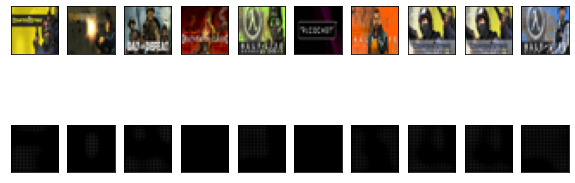


[EPOCH: 2], 	Train Loss: 12151.6164, 	Test Loss: 10730.6565


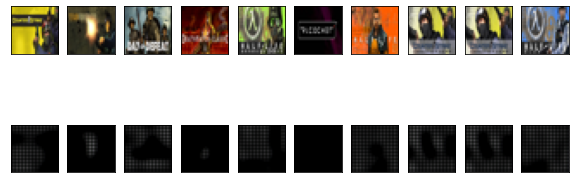


[EPOCH: 3], 	Train Loss: 9511.6545, 	Test Loss: 8094.6052


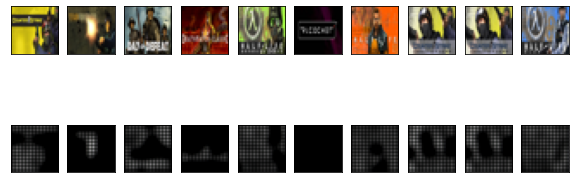


[EPOCH: 4], 	Train Loss: 7016.9954, 	Test Loss: 5790.0075


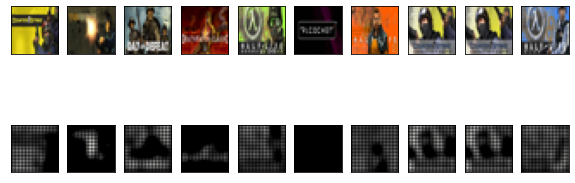


[EPOCH: 5], 	Train Loss: 5105.0477, 	Test Loss: 4150.2892


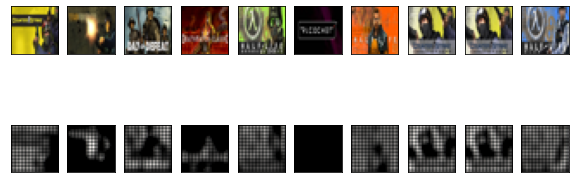


[EPOCH: 6], 	Train Loss: 3807.0542, 	Test Loss: 3200.3929


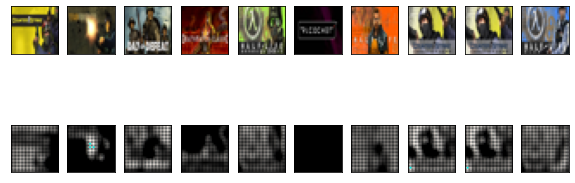


[EPOCH: 7], 	Train Loss: 2965.9309, 	Test Loss: 2461.7007


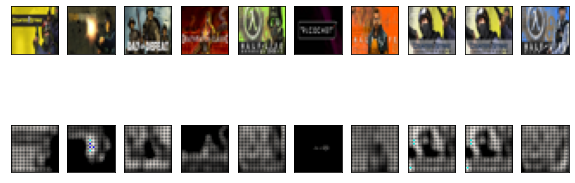


[EPOCH: 8], 	Train Loss: 2431.8141, 	Test Loss: 2157.8290


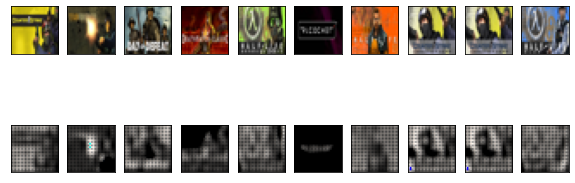


[EPOCH: 9], 	Train Loss: 2092.2827, 	Test Loss: 1922.1105


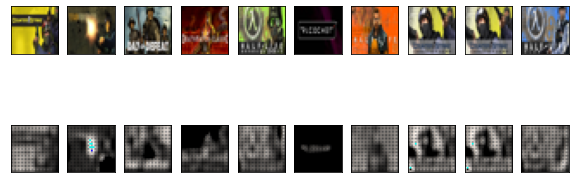


[EPOCH: 10], 	Train Loss: 1867.9575, 	Test Loss: 1717.8511


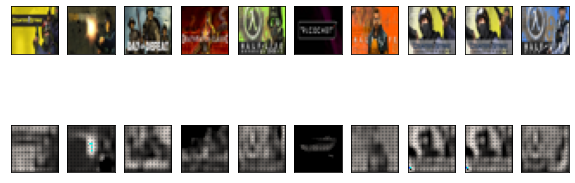


[EPOCH: 11], 	Train Loss: 1722.9631, 	Test Loss: 1639.1374


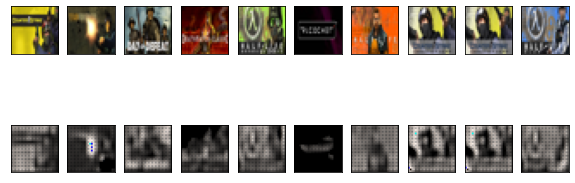


[EPOCH: 12], 	Train Loss: 1610.9041, 	Test Loss: 1538.6816


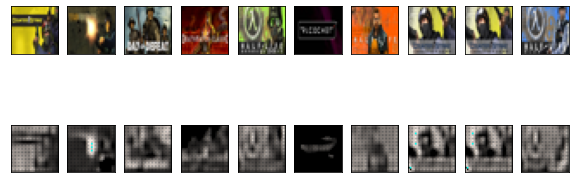


[EPOCH: 13], 	Train Loss: 1526.6986, 	Test Loss: 1471.9687


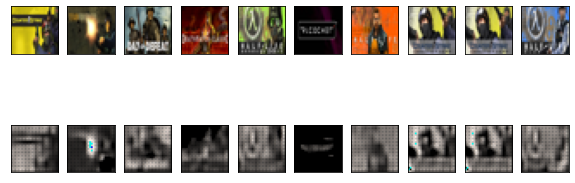


[EPOCH: 14], 	Train Loss: 1456.3720, 	Test Loss: 1406.4338


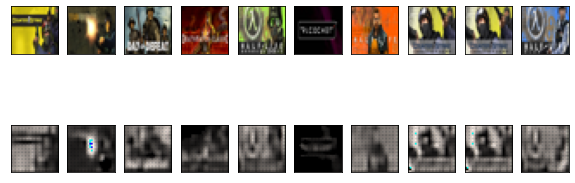


[EPOCH: 15], 	Train Loss: 1414.4796, 	Test Loss: 1390.0060


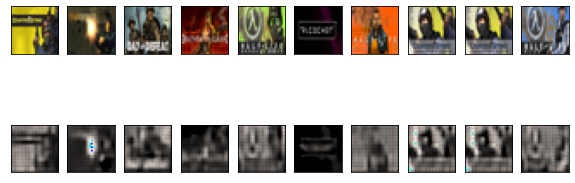


[EPOCH: 16], 	Train Loss: 1371.9616, 	Test Loss: 1321.5001


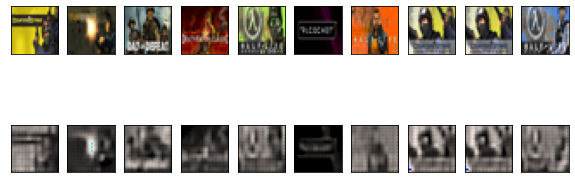


[EPOCH: 17], 	Train Loss: 1336.4767, 	Test Loss: 1297.4518


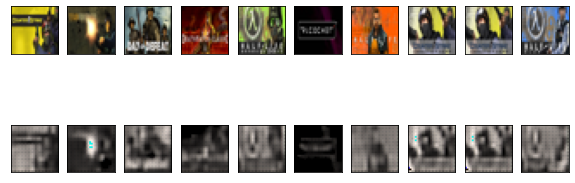


[EPOCH: 18], 	Train Loss: 1311.0933, 	Test Loss: 1278.4815


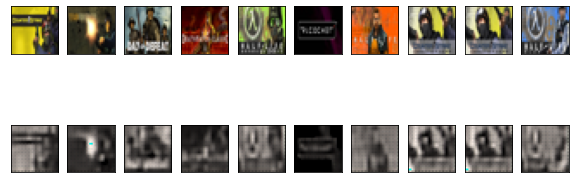


[EPOCH: 19], 	Train Loss: 1293.3258, 	Test Loss: 1254.3436


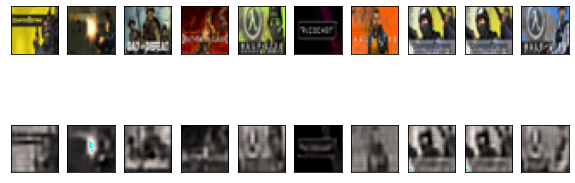


[EPOCH: 20], 	Train Loss: 1265.1681, 	Test Loss: 1243.7165


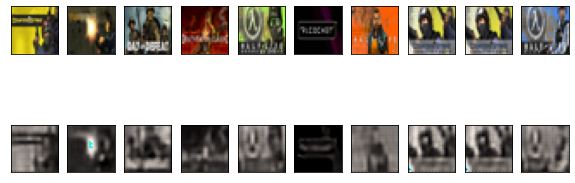


[EPOCH: 21], 	Train Loss: 1254.6708, 	Test Loss: 1267.5752


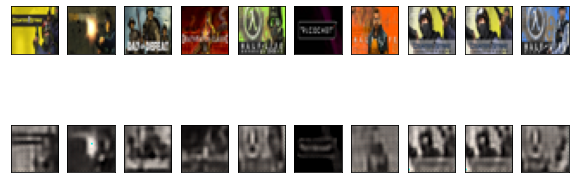


[EPOCH: 22], 	Train Loss: 1237.5264, 	Test Loss: 1208.7891


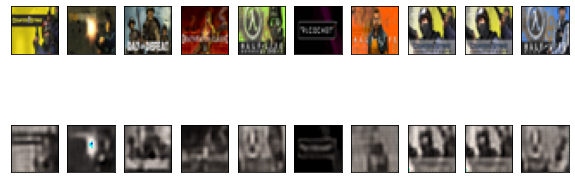


[EPOCH: 23], 	Train Loss: 1175.4740, 	Test Loss: 1071.8616


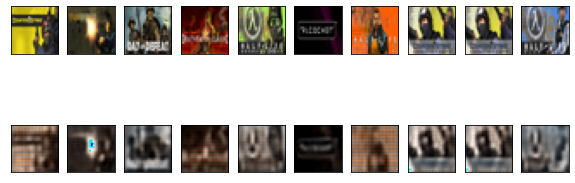


[EPOCH: 24], 	Train Loss: 1006.2748, 	Test Loss: 925.8056


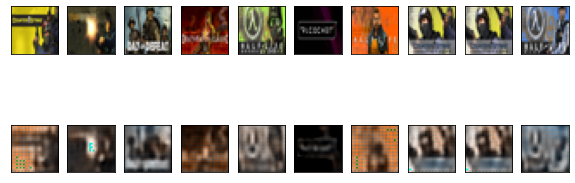


[EPOCH: 25], 	Train Loss: 895.0367, 	Test Loss: 839.4412


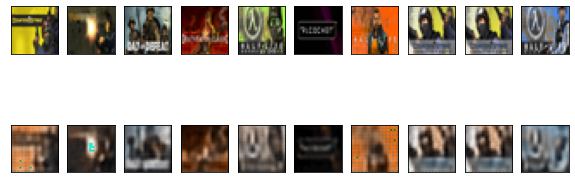


[EPOCH: 26], 	Train Loss: 839.0783, 	Test Loss: 802.5081


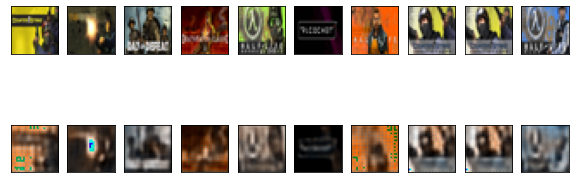


[EPOCH: 27], 	Train Loss: 801.6053, 	Test Loss: 754.2244


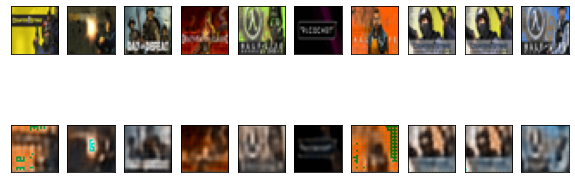


[EPOCH: 28], 	Train Loss: 765.2055, 	Test Loss: 729.4155


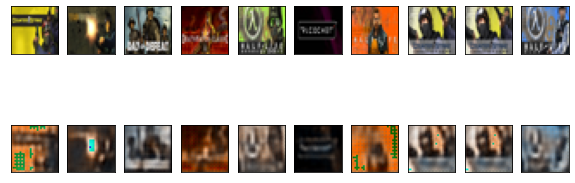


[EPOCH: 29], 	Train Loss: 749.1107, 	Test Loss: 714.5883


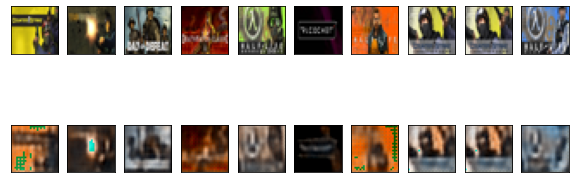


[EPOCH: 30], 	Train Loss: 736.7308, 	Test Loss: 700.6382


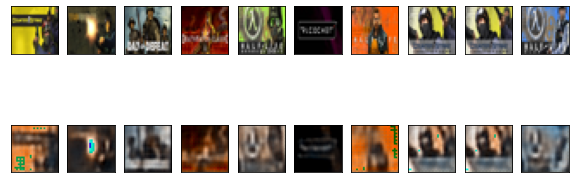


[EPOCH: 31], 	Train Loss: 720.3266, 	Test Loss: 709.7280


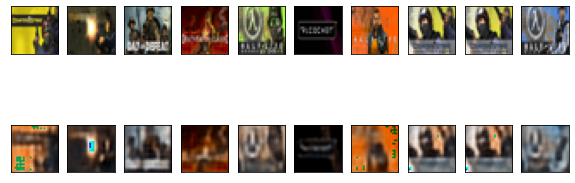


[EPOCH: 32], 	Train Loss: 712.8288, 	Test Loss: 680.9023


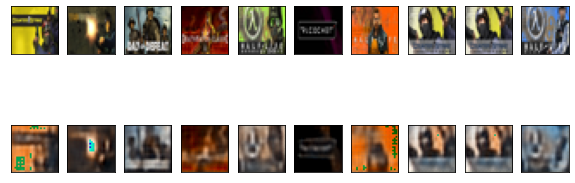


[EPOCH: 33], 	Train Loss: 707.5565, 	Test Loss: 690.3387


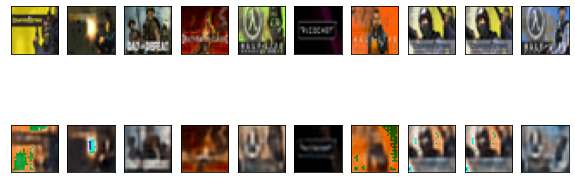


[EPOCH: 34], 	Train Loss: 697.0845, 	Test Loss: 669.2616


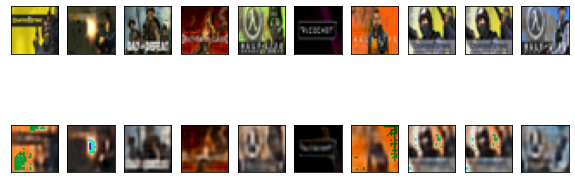


[EPOCH: 35], 	Train Loss: 690.6063, 	Test Loss: 690.6863


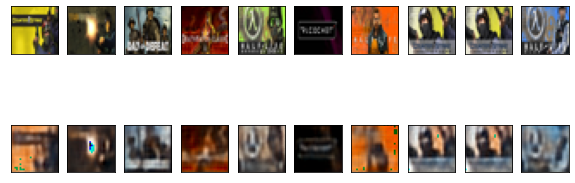


[EPOCH: 36], 	Train Loss: 680.7711, 	Test Loss: 700.5331


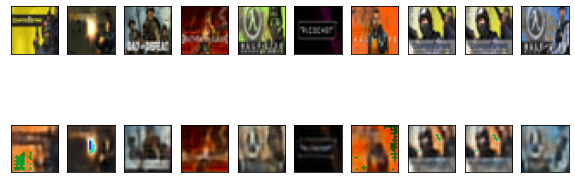


[EPOCH: 37], 	Train Loss: 663.8937, 	Test Loss: 627.8740


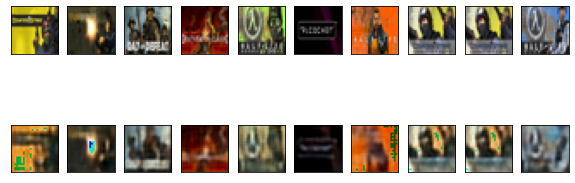


[EPOCH: 38], 	Train Loss: 649.2355, 	Test Loss: 607.7763


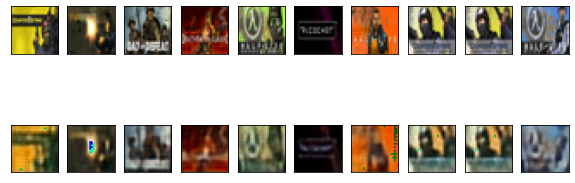


[EPOCH: 39], 	Train Loss: 626.0164, 	Test Loss: 1516.6181


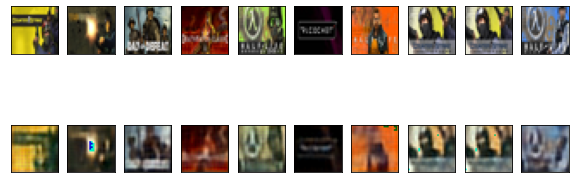


[EPOCH: 40], 	Train Loss: 615.3019, 	Test Loss: 583.8150


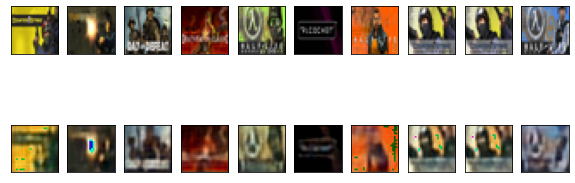


[EPOCH: 41], 	Train Loss: 608.8803, 	Test Loss: 574.8217


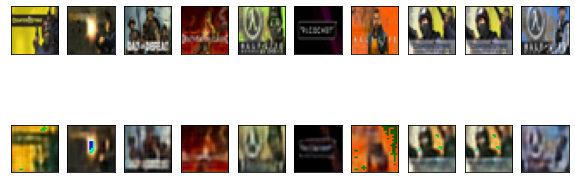


[EPOCH: 42], 	Train Loss: 598.7313, 	Test Loss: 583.3431


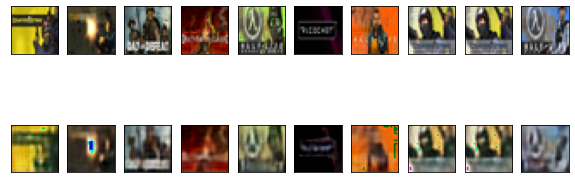


[EPOCH: 43], 	Train Loss: 594.4073, 	Test Loss: 564.2725


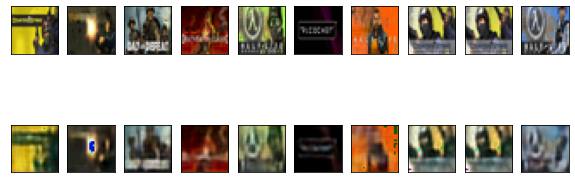


[EPOCH: 44], 	Train Loss: 583.8807, 	Test Loss: 550.8230


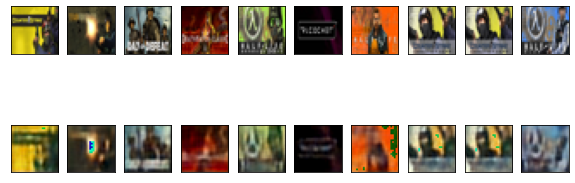


[EPOCH: 45], 	Train Loss: 578.0746, 	Test Loss: 551.7075


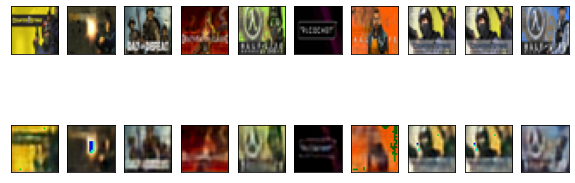


[EPOCH: 46], 	Train Loss: 575.1510, 	Test Loss: 540.1883


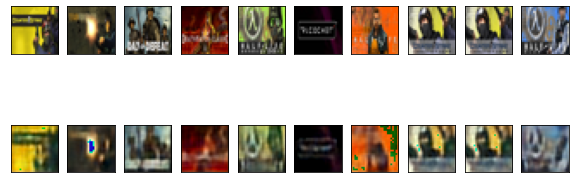


[EPOCH: 47], 	Train Loss: 565.3978, 	Test Loss: 552.9009


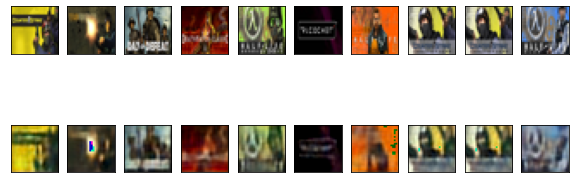


[EPOCH: 48], 	Train Loss: 566.0527, 	Test Loss: 528.4675


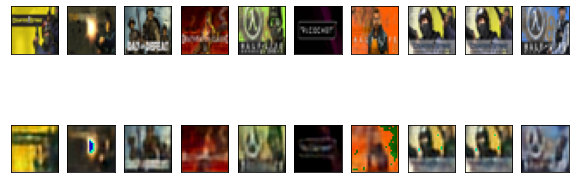


[EPOCH: 49], 	Train Loss: 559.2353, 	Test Loss: 582.1999


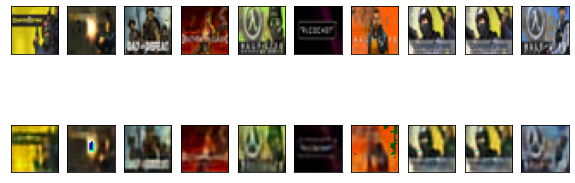


[EPOCH: 50], 	Train Loss: 555.0705, 	Test Loss: 521.0624


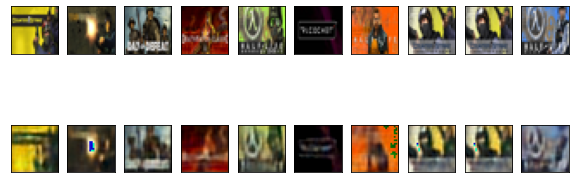


[EPOCH: 51], 	Train Loss: 554.7401, 	Test Loss: 526.9120


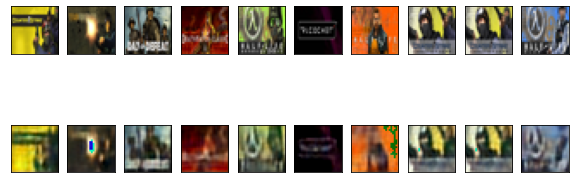


[EPOCH: 52], 	Train Loss: 546.5350, 	Test Loss: 515.0078


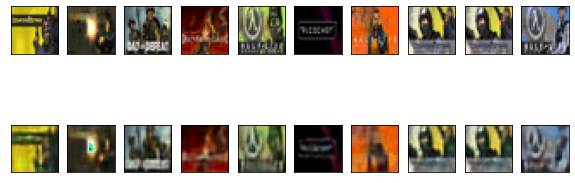


[EPOCH: 53], 	Train Loss: 541.5398, 	Test Loss: 554.1031


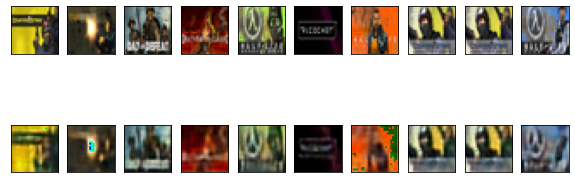


[EPOCH: 54], 	Train Loss: 538.2512, 	Test Loss: 513.4546


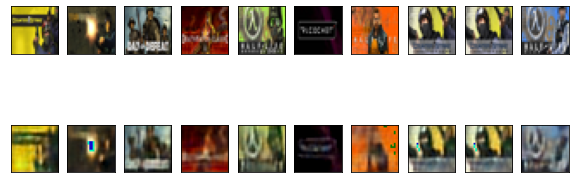


[EPOCH: 55], 	Train Loss: 534.4209, 	Test Loss: 517.4717


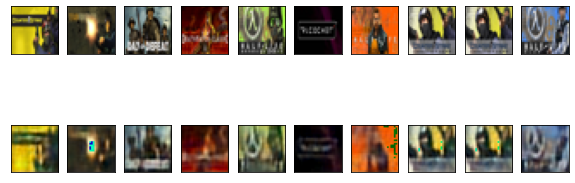


[EPOCH: 56], 	Train Loss: 529.8963, 	Test Loss: 502.7293


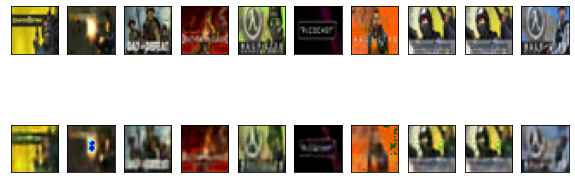


[EPOCH: 57], 	Train Loss: 525.5348, 	Test Loss: 502.2668


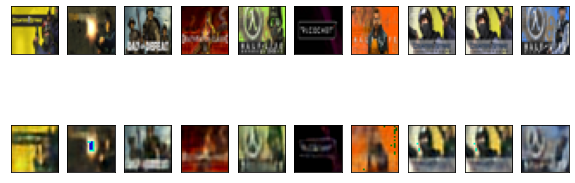


[EPOCH: 58], 	Train Loss: 520.4877, 	Test Loss: 503.0567


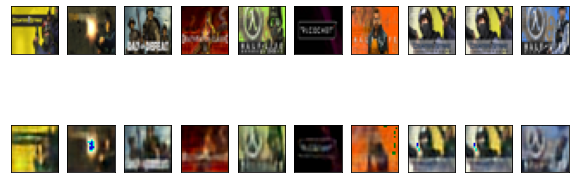


[EPOCH: 59], 	Train Loss: 519.9835, 	Test Loss: 492.0566


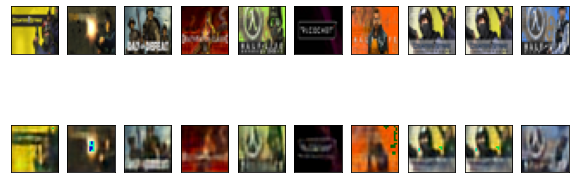


[EPOCH: 60], 	Train Loss: 516.3315, 	Test Loss: 481.8993


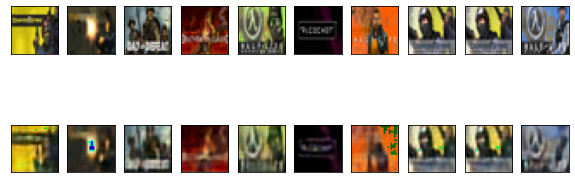


[EPOCH: 61], 	Train Loss: 513.8595, 	Test Loss: 493.9895


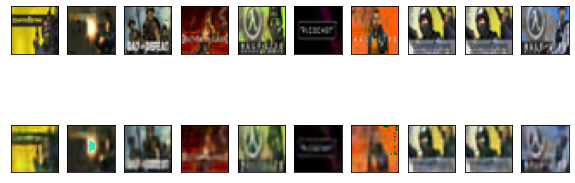


[EPOCH: 62], 	Train Loss: 512.6920, 	Test Loss: 485.2867


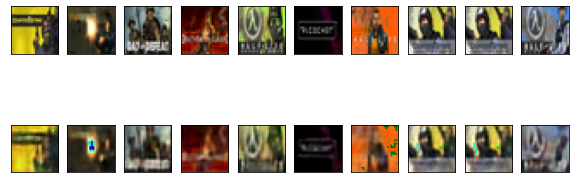


[EPOCH: 63], 	Train Loss: 505.3726, 	Test Loss: 486.6643


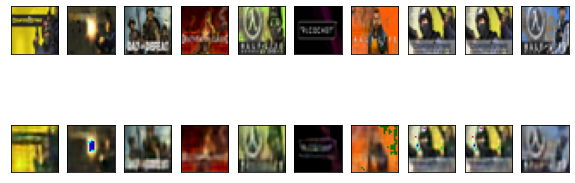


[EPOCH: 64], 	Train Loss: 504.7098, 	Test Loss: 471.0327


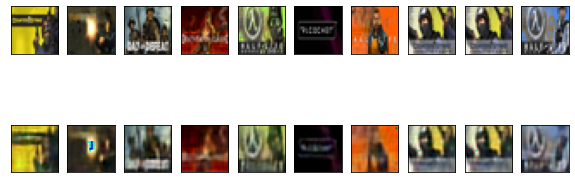


[EPOCH: 65], 	Train Loss: 504.2834, 	Test Loss: 486.3519


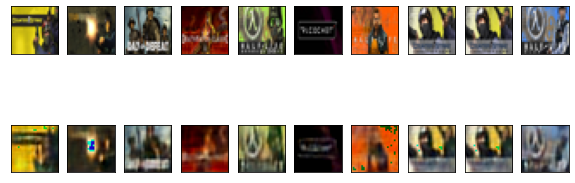


[EPOCH: 66], 	Train Loss: 504.4052, 	Test Loss: 16691.9077


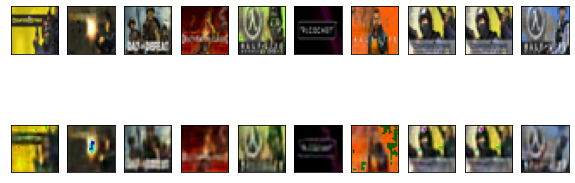


[EPOCH: 67], 	Train Loss: 503.5412, 	Test Loss: 39757.0689


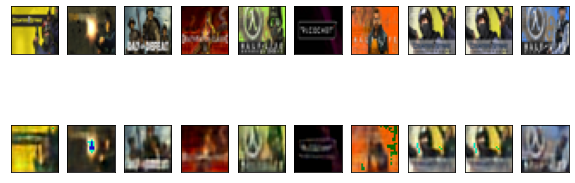


[EPOCH: 68], 	Train Loss: 493.4255, 	Test Loss: 3548459.1800


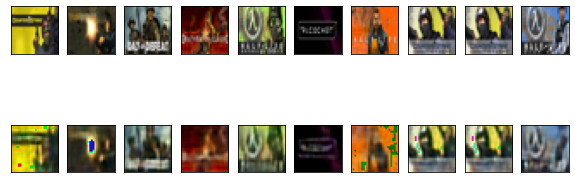


[EPOCH: 69], 	Train Loss: 494.0712, 	Test Loss: 241395.9442


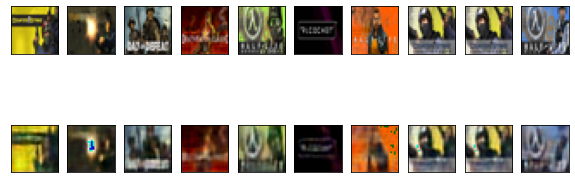


[EPOCH: 70], 	Train Loss: 491.1015, 	Test Loss: 887617.7169


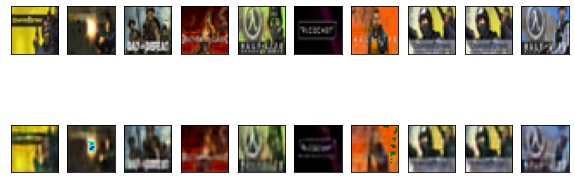


[EPOCH: 71], 	Train Loss: 491.6614, 	Test Loss: 1830557.1931


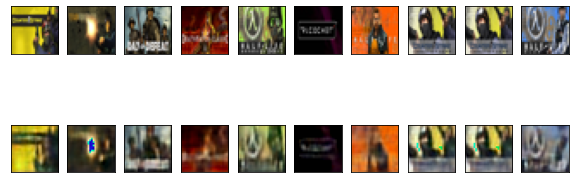


[EPOCH: 72], 	Train Loss: 486.7415, 	Test Loss: 346725.5263


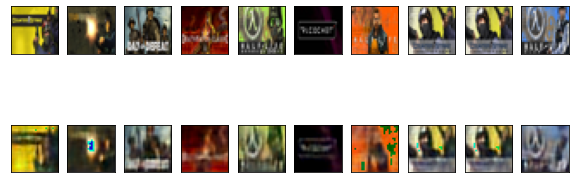


[EPOCH: 73], 	Train Loss: 490.4201, 	Test Loss: 51641.6236


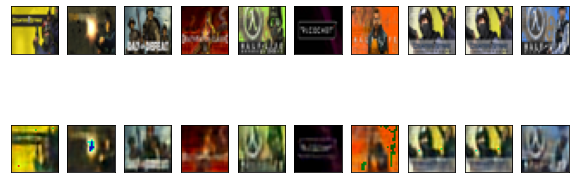


[EPOCH: 74], 	Train Loss: 483.1287, 	Test Loss: 12006.7388


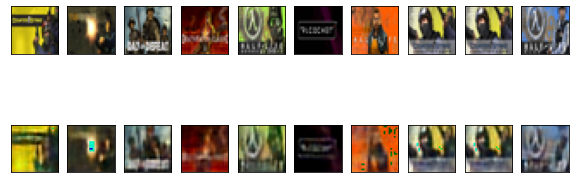


[EPOCH: 75], 	Train Loss: 478.6743, 	Test Loss: 1223.1162


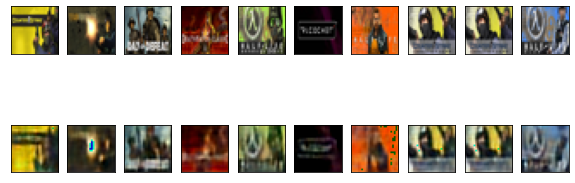


[EPOCH: 76], 	Train Loss: 479.9626, 	Test Loss: 1571.9600


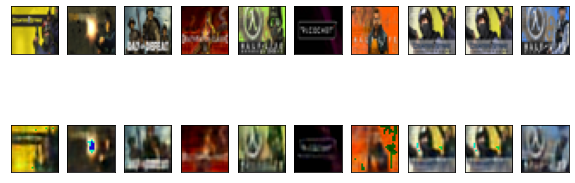


[EPOCH: 77], 	Train Loss: 481.6155, 	Test Loss: 7248.2401


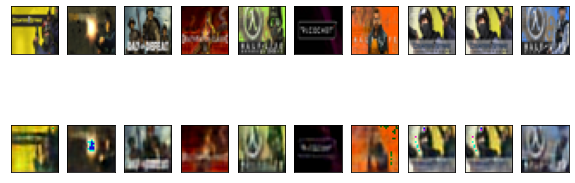


[EPOCH: 78], 	Train Loss: 474.2182, 	Test Loss: 987.8111


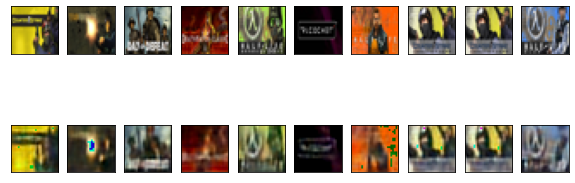


[EPOCH: 79], 	Train Loss: 467.9119, 	Test Loss: 550.7272


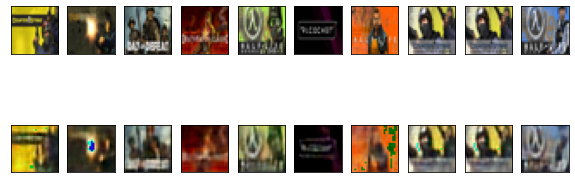


[EPOCH: 80], 	Train Loss: 475.0986, 	Test Loss: 443.2779


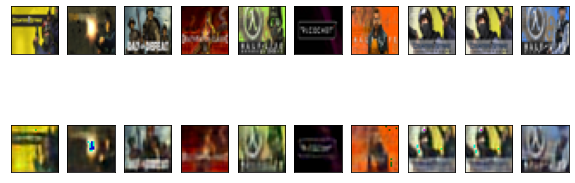


[EPOCH: 81], 	Train Loss: 466.4807, 	Test Loss: 24641.1789


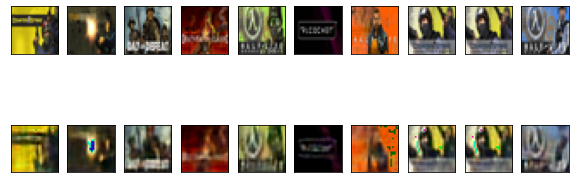


[EPOCH: 82], 	Train Loss: 465.4225, 	Test Loss: 447.1351


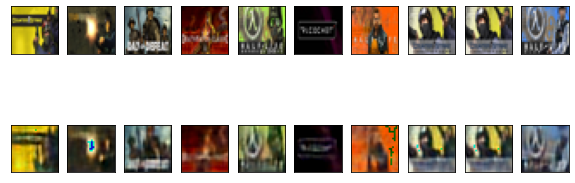


[EPOCH: 83], 	Train Loss: 466.2238, 	Test Loss: 826.7343


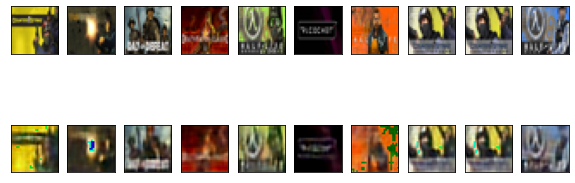


[EPOCH: 84], 	Train Loss: 463.9650, 	Test Loss: 446.6975


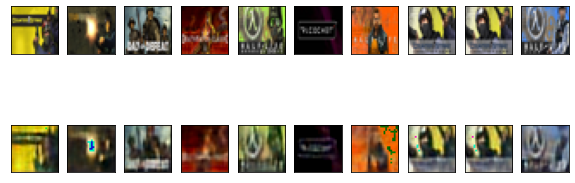


[EPOCH: 85], 	Train Loss: 457.6983, 	Test Loss: 643.7191


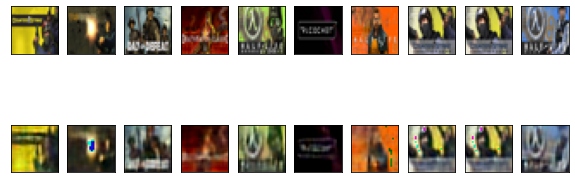


[EPOCH: 86], 	Train Loss: 459.6659, 	Test Loss: 630.4545


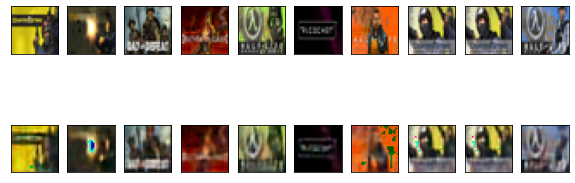


[EPOCH: 87], 	Train Loss: 458.8730, 	Test Loss: 670.4803


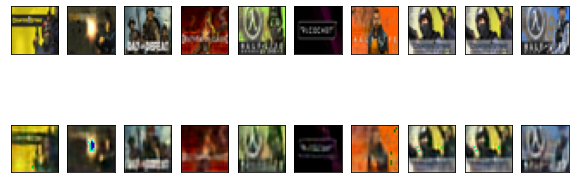


[EPOCH: 88], 	Train Loss: 458.4465, 	Test Loss: 521.4541


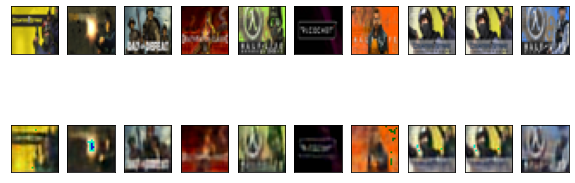


[EPOCH: 89], 	Train Loss: 456.5652, 	Test Loss: 712.7482


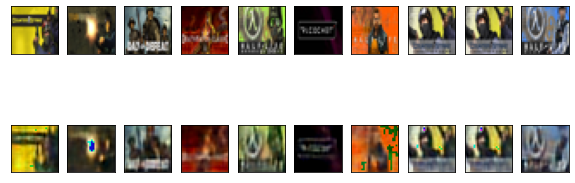


[EPOCH: 90], 	Train Loss: 452.5280, 	Test Loss: 5267.0552


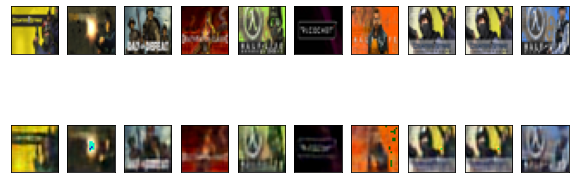


[EPOCH: 91], 	Train Loss: 454.0204, 	Test Loss: 504.1725


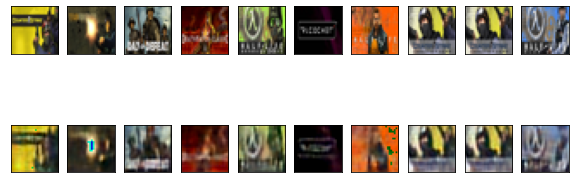


[EPOCH: 92], 	Train Loss: 449.9643, 	Test Loss: 7408.1276


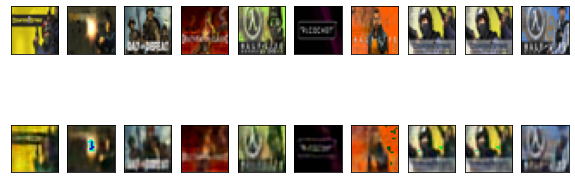


[EPOCH: 93], 	Train Loss: 449.0587, 	Test Loss: 445.0643


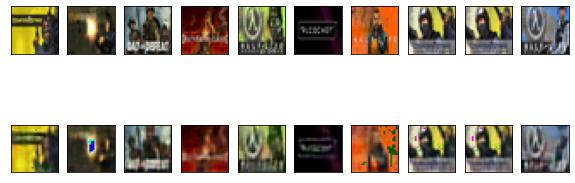


[EPOCH: 94], 	Train Loss: 446.0147, 	Test Loss: 1756.3786


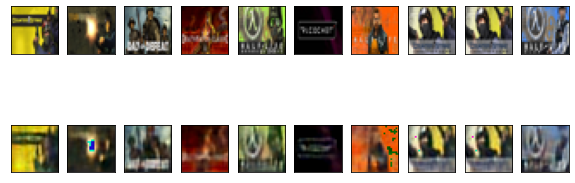


[EPOCH: 95], 	Train Loss: 447.7670, 	Test Loss: 14379.9316


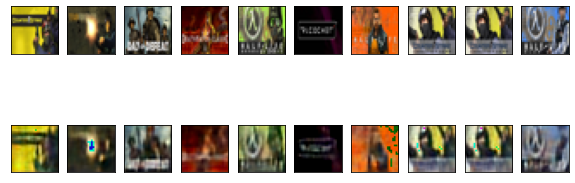


[EPOCH: 96], 	Train Loss: 446.3253, 	Test Loss: 81753.7821


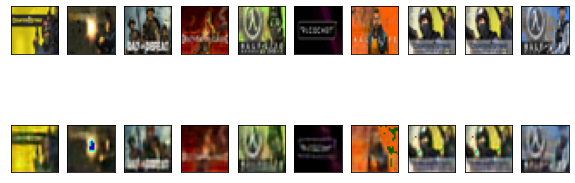


[EPOCH: 97], 	Train Loss: 439.4739, 	Test Loss: 4288.4142


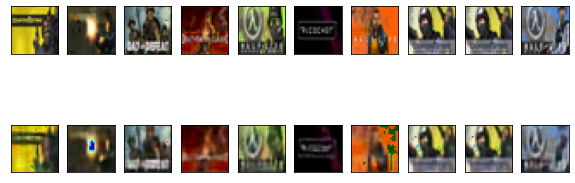


[EPOCH: 98], 	Train Loss: 442.9800, 	Test Loss: 433.0167


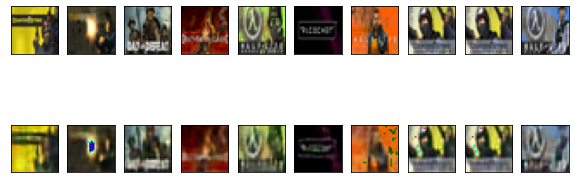


[EPOCH: 99], 	Train Loss: 440.5094, 	Test Loss: 444.1269


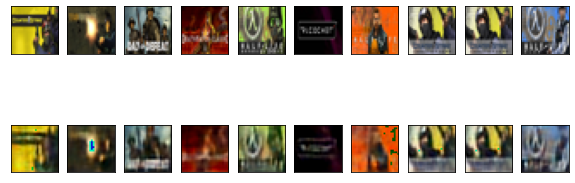


[EPOCH: 100], 	Train Loss: 440.9473, 	Test Loss: 439.9986


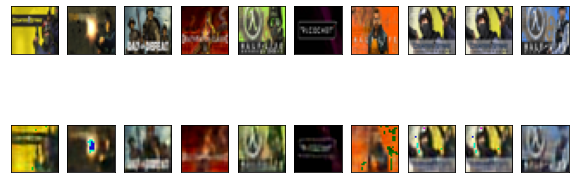

In [ ]:
import cv2

dataset = CustomDataset(x_data = images, y_data = labels)

train_loader = DataLoader(
    dataset,
    batch_size = BATCH_SIZE,
    shuffle = True
)

test_loader = DataLoader(
    dataset,
    batch_size = BATCH_SIZE,
    shuffle = False
)

# 학습 및 평가
for epoch in range(1, EPOCHS + 1):
  train_loss = train(model, train_loader, optimizer)
  test_loss, real_image, gen_image = evaluate(model, test_loader)
  print(f"\n[EPOCH: {epoch}], \tTrain Loss: {train_loss:.4f}, \tTest Loss: {test_loss:.4f}")

  # 이미지 시각화
  f, a = plt.subplots(2, 10, figsize = (10, 4))
  for i in range(10):
    image = np.reshape(real_image[0][i], (3, 28, 28))
    image = np.swapaxes(image, 0, 2).astype(np.uint8)
    a[0][i].imshow(image)
    a[0][i].set_xticks(())
    a[0][i].set_yticks(())

  for i in range(10):
    image = np.reshape(gen_image[0][i], (3, 28, 28))
    image = np.swapaxes(image, 0, 2).astype(np.uint8)
    a[1][i].imshow(image)
    a[1][i].set_xticks(())
    a[1][i].set_yticks(())
  plt.show()

# 평가

In [ ]:
dataset = CustomDataset(x_data = images, y_data = labels)

dataloader = DataLoader(
    dataset,
    batch_size = BATCH_SIZE,
    shuffle = False
)

model.eval()

img_vecs = []
idx2game_id = []

with torch.no_grad():
  for batch_idx, (image, label) in enumerate(dataloader):
    image = image.to(DEVICE)
    label = label.to(DEVICE)

    encoded, decoded = model(image)
    img_vecs.append(encoded.cpu().detach().numpy())
    idx2game_id.append(label.cpu().detach().numpy())

img_vecs = np.concatenate(img_vecs)
idx2game_id = np.concatenate(idx2game_id)

In [ ]:
img_vecs.shape

(22443, 128)

In [ ]:
idx2game_id.shape

(22443,)

In [ ]:
game_id2tite = {}
game_id2content = {}
game_id2clean_genres = {}

def get_data(x):
  game_id2tite[x['game_id']] = x['title']
  game_id2content[x['game_id']] = x['content']
  game_id2clean_genres[x['game_id']] = x['clean_genres']

_ = content_df.apply(lambda x : get_data(x), axis = 1)

In [ ]:
def cos_sim(A, B):
  return np.dot(A, B)/(np.linalg.norm(A)*np.linalg.norm(B))

def get_sim_game(vecs, idx, top = 10):
  sim_scores = [cos_sim(vecs[idx], vecs[i]) for i in range(vecs.shape[0])]
  sim_scores = [(i, c) for i, c in enumerate(sim_scores) if i != idx] # 자기 자신을 제외한 영화들의 유사도 및 인덱스를 추출 
  sim_scores = sorted(sim_scores, key = lambda x: x[1], reverse=True)

  choise_game_game_id = idx2game_id[idx]
  choise_game_title = game_id2tite[choise_game_game_id]
  choise_game_content = game_id2content[choise_game_game_id]
  choise_game_clean_genres = game_id2clean_genres[choise_game_game_id]
  
  print('-'*100)
  print(f'선택된 게임의 ID: {choise_game_game_id}, 선택된 게임의 title: {choise_game_title}')
  print(f'선택된 게임의 content: {choise_game_content}')
  print(f'선택된 게임의 genres: {choise_game_clean_genres}')
  img = Image.fromarray(image_dict[int(choise_game_game_id)])
  display(img)
  print('-'*100)

  for idx, (i, sim_score) in enumerate(sim_scores[0:top]):
    sim_game_game_id = idx2game_id[i]
    sim_game_title = game_id2tite[sim_game_game_id]
    sim_game_content = game_id2content[sim_game_game_id]
    sim_game_clean_genres = game_id2clean_genres[sim_game_game_id]

    print('-'*100)
    print(f'TOP{idx + 1} 게임의 ID: {sim_game_game_id}, title: {sim_game_title}, Score: {sim_score}')
    print(f'선택된 게임의 content: {sim_game_content}')
    print(f'선택된 게임의 genres: {sim_game_clean_genres}')
    img = Image.fromarray(image_dict[int(sim_game_game_id)])
    display(img)
    print('-'*100)

----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 40, 선택된 게임의 title: Deathmatch Classic
선택된 게임의 content: Enjoy fast-paced multiplayer gaming with Deathmatch Classic (a.k.a. DMC). Valve's tribute to the work of id software, DMC invites players to grab their rocket launchers and put their reflexes to the test in a collection of futuristic settings.
선택된 게임의 genres: ['Action', 'FPS', 'Classic', 'Multiplayer', 'Shooter', 'First-Person', 'Arena Shooter', 'Sci-fi', 'Old School', 'Competitive', 'Fast-Paced', 'Co-op', 'Retro', 'Gore', 'Difficult', "1990's"]


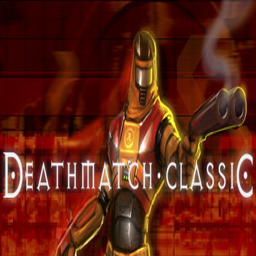

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 501740, title: Dropship Down, Score: 0.4156653881072998
선택된 게임의 content: Dropship Down is a fun and intense twin-stick alien shooter for up to four players.
선택된 게임의 genres: ['Action', 'Casual', 'Early Access', 'Massively Multiplayer']


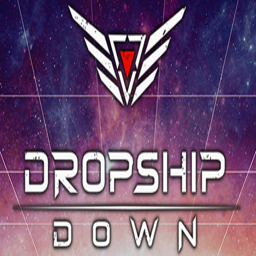

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 637090, title: BATTLETECH, Score: 0.39888596534729004
선택된 게임의 content: Take command of your own mercenary outfit of 'Mechs and the MechWarriors that pilot them, struggling to stay afloat as you find yourself drawn into a brutal interstellar civil war.
선택된 게임의 genres: ['Mechs', 'Strategy', 'Turn-Based Tactics', 'Turn-Based', 'Sci-fi', 'Turn-Based Strategy', 'Tactical', 'Action', 'Singleplayer', 'Robots', 'RPG', 'Adventure', 'Space', 'Character Customization', 'Multiplayer', 'Futuristic', 'Management', 'Story Rich', 'Great Soundtrack', 'Difficult']


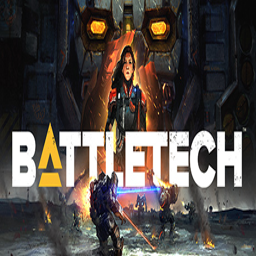

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 766280, title: A Light in the Dark, Score: 0.39591920375823975
선택된 게임의 content: ──We cannot choose in this unfair world.The rich boy stuck in his never changing daily life...The fierce girl struggling for survival...Two people in totally opposite positions in life.In the face of confusion and the choices before them, what will they find...?
선택된 게임의 genres: ['Indie', 'Casual', 'Visual Novel', 'Violent', 'Anime', 'Gore', 'Story Rich', 'Great Soundtrack', 'Multiple Endings', 'Point & Click', 'Crowdfunded', 'Kickstarter', 'Choices Matter']


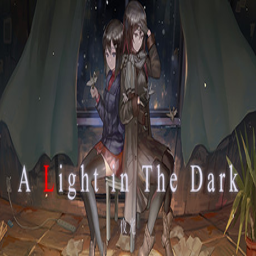

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 710780, title: Sky Jump, Score: 0.39449840784072876
선택된 게임의 content: Sky Jump is a gorgeous, addictive game that will keep the player entertained for hours.
선택된 게임의 genres: ['Action', 'Indie', 'Casual']


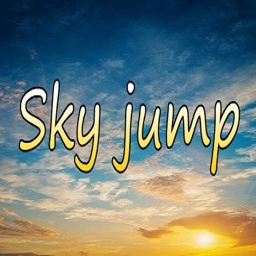

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 317330, title: Defenders of Time, Score: 0.39339950680732727
선택된 게임의 content: Set in an alternative universe where the fabric of time must be protected, Defenders of Time is a fast-paced tower defense game for up to eight players. Players must strategically place towers in order to stop wave after wave of alien foes who are seeking to destroy our Time Beacons.
선택된 게임의 genres: ['Strategy', 'Tower Defense', 'Indie', 'Co-op']


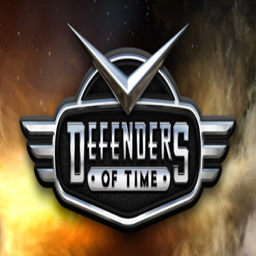

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 714370, title: LEFT ALIVE™, Score: 0.39041775465011597
선택된 게임의 content: LEFT ALIVE™ is a brand-new survival action shooter telling a human story of survival from the perspective of three different protagonists during the devastating invasion set in war-torn Novo Slava in 2127.
선택된 게임의 genres: ['Action', 'Violent', 'Gore', 'Mechs', 'Third-Person Shooter', 'Stealth', 'Survival', 'Shooter', 'Military', 'Third Person', 'Choices Matter', 'Arcade', 'Realistic', 'Female Protagonist', 'Open World', 'Anime', 'Robots']


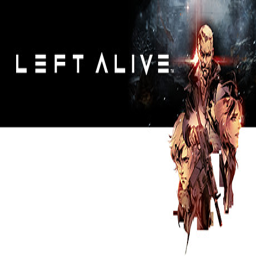

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 532890, title: Civil War: 1862, Score: 0.3838876187801361
선택된 게임의 content: Relive iconic battles of the American Civil War. Take command of both the Union and Confederate forces in this exciting turn-based strategy game.
선택된 게임의 genres: ['Strategy', 'Historical']


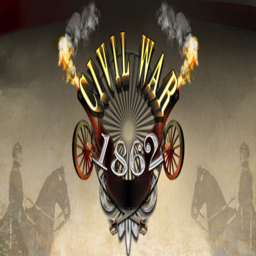

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 741250, title: The Sand Man, Score: 0.3803042769432068
선택된 게임의 content: “I’ll tell you a scary story. It’s so scary you might not be able to take it. It’s the story of the Sand Man...” This is the second title in the Strange Man series, developed by Uri Games. Unable to sleep and exhausted, Sophie wanders into a town where everything sleeps. That is where the terror begins...
선택된 게임의 genres: ['Indie', 'Casual', 'Adventure', 'RPGMaker', 'Horror', '2D', 'Pixel Graphics', 'Story Rich', 'Multiple Endings', 'Female Protagonist', 'Atmospheric', 'Fantasy', 'Singleplayer', 'Psychological Horror', 'Surreal', 'Great Soundtrack', 'Dark', 'Dark Fantasy', 'Violent', 'Anime']


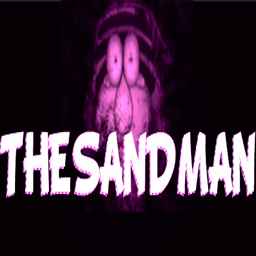

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 458380, title: Gahkthun of the Golden Lightning Steam Edition, Score: 0.37884989380836487
선택된 게임의 content: Lightning crackles in the sky. A lone man hovers, overlooking The Academia. His name is Nikola Tesla, the one who will set this land right. With one assistant at his side, he shall face the council, overthrow the shadows in control, and rescue the unwitting students.
선택된 게임의 genres: ['Nudity', 'Adventure', 'Visual Novel', 'Anime', 'Steampunk', 'Female Protagonist', 'Singleplayer', 'Story Rich', 'Romance', 'Action', 'Sexual Content']


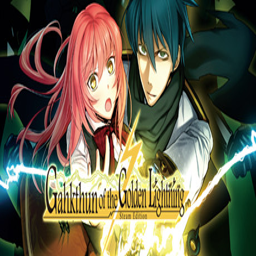

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 234630, title: Project CARS, Score: 0.3781139850616455
선택된 게임의 content: THE ULTIMATE DRIVER JOURNEY delivers the soul of motor racing in the world’s most beautiful, authentic, and technically-advanced racing game.
선택된 게임의 genres: ['Racing', 'Simulation', 'Automobile Sim', 'Driving', 'Realistic', 'Multiplayer', 'Sports', 'Singleplayer', 'Physics', 'Atmospheric', 'VR', 'First-Person', 'Controller', 'Action', 'Open World', 'Third Person', 'Co-op', 'Arcade', 'TrackIR', 'Indie']


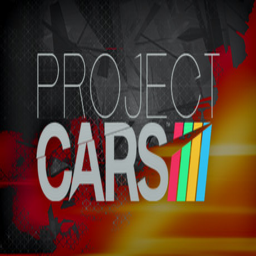

----------------------------------------------------------------------------------------------------


In [ ]:
get_sim_game(img_vecs, 3)

# 데이터 저장

In [ ]:
import pickle

# save
with open(DATA_DIR + 'img_vecs.pickle', 'wb') as f:
    pickle.dump(img_vecs, f, pickle.HIGHEST_PROTOCOL)